<a href="https://colab.research.google.com/github/llamb993/Store_Classification_Project/blob/main/StoreClassifcation2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
%load_ext tensorboard
import datetime
from sklearn.preprocessing import MinMaxScaler
import zipfile

In [ ]:
pip install pandas_profiling

In [ ]:
pip install featuretools

In [ ]:
import featuretools

In [ ]:
pip install evalml

In [ ]:
import evalml
from evalml import AutoMLSearch
from evalml.objectives import LeadScoring

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
import pandas_profiling
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Specify the path to the ZIP file
zip_path = r'drive/MyDrive/Store_Classification/storedata.csv.zip'

# Open the ZIP file
with zipfile.ZipFile(zip_path, 'r') as zip_file:
    # Extract the first file in the ZIP archive
    csv_file_name = zip_file.namelist()[0]
    zip_file.extract(csv_file_name)

# Read the extracted CSV file using pandas
df = pd.read_csv(csv_file_name)

# Display the contents of the DataFrame
df.head()

,Town,Country,Store ID,Manager name,Staff,Floor Space,Window,Car park,Demographic score,Location,40min population,30 min population,20 min population,10 min population,Store age,Clearance space,Competition number,Competition score,Performance
0,Swinton (Greater Manchester),UK,1437,Roger,9,18526,121,Yes,10,Retail Park,1288374,1138224,1006986,1002340,3,238,16,16,Good
1,Stamford,UK,1544,Ella,8,18569,121,Yes,11,Shopping Centre,1086225,1015321,1012182,1008436,4,384,15,19,Good
2,Skipton,UK,2039,Valentina,-2,12288,105,No,12,Retail Park,1595638,1281661,1104490,1011395,11,219,13,18,Bad
3,Stratton,UK,2055,Antonia,7,17092,117,No,14,High Street,1179395,1022959,1009496,1002169,5,261,15,12,Bad
4,Shepperton,UK,2141,Gabriel,7,11307,103,No,18,Retail Park,1398558,1085170,1003137,1002513,7,200,19,13,Bad


In [ ]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# drop rows with too many unique values here for the data to be useful in building the model
df = df.drop(['Store ID','Town','Country','Manager name'],axis=1)
df.head()

,Staff,Floor Space,Window,Car park,Demographic score,Location,40min population,30 min population,20 min population,10 min population,Store age,Clearance space,Competition number,Competition score,Performance
0,9,18526,121,Yes,10,Retail Park,1288374,1138224,1006986,1002340,3,238,16,16,Good
1,8,18569,121,Yes,11,Shopping Centre,1086225,1015321,1012182,1008436,4,384,15,19,Good
2,-2,12288,105,No,12,Retail Park,1595638,1281661,1104490,1011395,11,219,13,18,Bad
3,7,17092,117,No,14,High Street,1179395,1022959,1009496,1002169,5,261,15,12,Bad
4,7,11307,103,No,18,Retail Park,1398558,1085170,1003137,1002513,7,200,19,13,Bad


In [ ]:
# check for Multicollinearity
#The correlation coefficient ranges from -1 to 1, where -1 indicates a strong negative correlation, 0 indicates no correlation, and 1 indicates a strong positive correlation between two variables
correlation_matrix = df.corr()
# Print the correlation matrix
correlation_matrix

,Staff,Floor Space,Window,Demographic score,40min population,30 min population,20 min population,10 min population,Store age,Clearance space,Competition number,Competition score
Staff,1.000000,0.076039,0.077630,-0.057831,-0.098366,-0.024631,-0.056310,-0.006601,-0.172655,0.110591,0.034571,0.123579
Floor Space,0.076039,1.000000,0.999208,0.038187,0.051918,-0.032199,-0.046161,-0.096698,-0.049285,0.627324,0.073559,0.091447
Window,0.077630,0.999208,1.000000,0.038633,0.053228,-0.028688,-0.042441,-0.091651,-0.048992,0.628509,0.074034,0.104551
Demographic score,-0.057831,0.038187,0.038633,1.000000,0.036694,-0.007616,0.053498,0.099587,-0.014967,0.041849,-0.100716,-0.072325
40min population,-0.098366,0.051918,0.053228,0.036694,1.000000,0.624732,0.516682,0.432857,-0.191329,-0.018234,-0.004326,0.040554
30 min population,-0.024631,-0.032199,-0.028688,-0.007616,0.624732,1.000000,0.766158,0.667031,-0.098829,-0.093048,-0.054191,0.046811
20 min population,-0.056310,-0.046161,-0.042441,0.053498,0.516682,0.766158,1.000000,0.807882,-0.046910,-0.085887,-0.081947,0.008492
10 min population,-0.006601,-0.096698,-0.091651,0.099587,0.432857,0.667031,0.807882,1.000000,-0.103815,-0.053129,-0.039108,0.068781
Store age,-0.172655,-0.049285,-0.048992,-0.014967,-0.191329,-0.098829,-0.046910,-0.103815,1.000000,-0.037935,-0.063024,-0.109725
Clearance space,0.110591,0.627324,0.628509,0.041849,-0.018234,-0.093048,-0.085887,-0.053129,-0.037935,1.000000,0.047191,0.156431


In [ ]:
# drop highly correlated varible to manage multicolinarity
df = df.drop(['30 min population'],axis=1)
df.head()

,Staff,Floor Space,Window,Car park,Demographic score,Location,40min population,20 min population,10 min population,Store age,Clearance space,Competition number,Competition score,Performance
0,9,18526,121,Yes,10,Retail Park,1288374,1006986,1002340,3,238,16,16,Good
1,8,18569,121,Yes,11,Shopping Centre,1086225,1012182,1008436,4,384,15,19,Good
2,-2,12288,105,No,12,Retail Park,1595638,1104490,1011395,11,219,13,18,Bad
3,7,17092,117,No,14,High Street,1179395,1009496,1002169,5,261,15,12,Bad
4,7,11307,103,No,18,Retail Park,1398558,1003137,1002513,7,200,19,13,Bad


<Axes: >

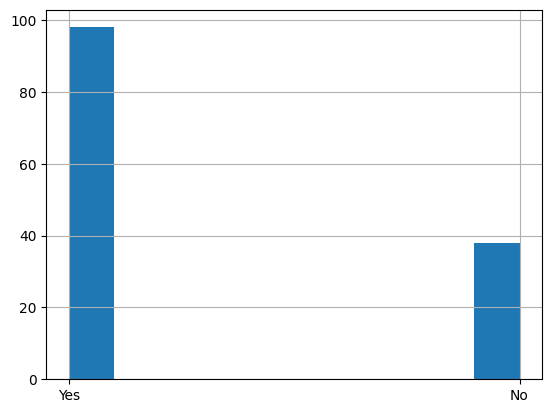

In [ ]:
# recoding car park variable - Y to Yes etc
df.replace({'Y':"Yes", 'N':'No'}, inplace=True)
df['Car park'].hist()

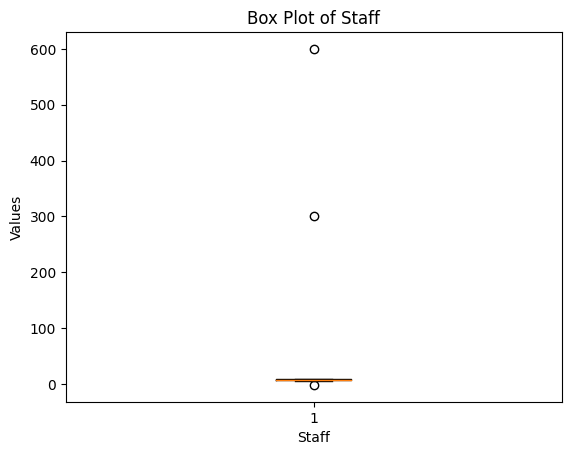

In [ ]:
# closer look at staff variable - outliers
plt.boxplot(df['Staff'])
plt.xlabel('Staff')
plt.ylabel('Values')
plt.title('Box Plot of Staff')
plt.show()

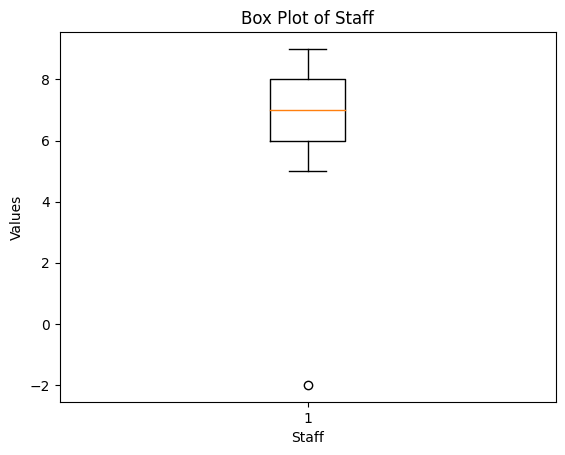

In [ ]:
# removed outliers
df = df[df['Staff'] <= 100]

plt.boxplot(df['Staff'])
plt.xlabel('Staff')
plt.ylabel('Values')
plt.title('Box Plot of Staff')
plt.show()

In [ ]:
# can't have negative staff members so negative values will be dropped
df = df[df['Staff'] >0]

df['Staff'].min()

5

In [ ]:
# Test Train Split
#from sklearn.model_selection import train_test_split

In [ ]:
targetName="Performance"
featureNames=df.columns[df.columns != targetName]
X = df[featureNames]
y = df[targetName]

X_train, X_test, y_train, y_test = evalml.preprocessing.split_data(X, y, problem_type='binary', random_seed=42)

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y_train

46     Bad
79    Good
28     Bad
68     Bad
42     Bad
      ... 
4      Bad
89    Good
12    Good
74    Good
59     Bad
Name: Performance, Length: 108, dtype: category
Categories (2, object): ['Bad', 'Good']

In [ ]:
# checking spilt across train and test datasets to make sure its not imbalanced
print(y_train.value_counts())
print(y_test.value_counts())

Good    55
Bad     53
Name: Performance, dtype: int64
Good    14
Bad     13
Name: Performance, dtype: int64


In [ ]:
# use the woodwork library to get data in correct structure for evalml
X_train.ww.init()
X_test.ww.init()
X_train

,Staff,Floor Space,Window,Car park,Demographic score,Location,40min population,20 min population,10 min population,Store age,Clearance space,Competition number,Competition score
46,5,11572,103,True,12,High Street,1518361,1002835,1001393,3,209,14,17
79,8,12092,105,True,11,Shopping Centre,1244807,1076416,1037950,11,236,16,11
28,5,16736,116,True,10,High Street,1474310,1003031,1002039,6,237,18,10
68,6,13709,109,True,11,High Street,1061935,1002529,1001991,8,291,14,11
42,7,11441,103,False,13,Shopping Centre,1772431,1140500,1051557,11,207,10,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,7,11307,103,False,18,Retail Park,1398558,1003137,1002513,7,200,19,13
89,9,17303,118,False,17,Shopping Centre,1812944,1016635,1013033,8,337,17,19
12,8,18923,122,True,18,Shopping Centre,1270676,1032335,1020164,9,237,10,17
74,9,15220,113,False,11,Shopping Centre,1103583,1003393,1000743,6,246,13,19


In [ ]:
automl = AutoMLSearch(
    X_train=X_train,
    y_train=y_train,
    problem_type="binary",
    objective='auto',
    additional_objectives=["auc"],
    max_batches=3,
    verbose=True,
    allowed_model_families=["xgboost","extra_trees","lightgbm"]
)

automl.search()

best_pipeline = automl.best_pipeline
feature_importance = best_pipeline.feature_importance

print(feature_importance)

AutoMLSearch will use mean CV score to rank pipelines.


INFO:evalml.automl.automl_search.verbose:AutoMLSearch will use mean CV score to rank pipelines.



*****************************


INFO:evalml.automl.automl_search.verbose:
*****************************


* Beginning pipeline search *


INFO:evalml.automl.automl_search.verbose:* Beginning pipeline search *


*****************************


INFO:evalml.automl.automl_search.verbose:*****************************


INFO:evalml.automl.automl_search.verbose:


Optimizing for Log Loss Binary. 


INFO:evalml.automl.automl_search.verbose:Optimizing for Log Loss Binary. 


Lower score is better.



INFO:evalml.automl.automl_search.verbose:Lower score is better.



Using SequentialEngine to train and score pipelines.


INFO:evalml.automl.automl_search.verbose:Using SequentialEngine to train and score pipelines.


Searching up to 3 batches for a total of None pipelines. 


INFO:evalml.automl.automl_search.verbose:Searching up to 3 batches for a total of None pipelines. 


Allowed model families: 



INFO:evalml.automl.automl_search.verbose:Allowed model families: 



FigureWidget({
    'data': [{'mode': 'lines+markers',
              'name': 'Best Score',
              'type': 'scatter',
              'uid': 'c80a991d-c69e-48da-9953-8949c1016e1f',
              'x': [],
              'y': []},
             {'marker': {'color': 'gray'},
              'mode': 'markers',
              'name': 'Iter score',
              'type': 'scatter',
              'uid': '6097d5e2-1a6d-4015-a305-1761be664e7e',
              'x': [],
              'y': []}],
    'layout': {'showlegend': False,
               'template': '...',
               'title': {'text': ('Pipeline Search: Iteration vs.' ... 'ore at current iteration</sub>')},
               'xaxis': {'rangemode': 'tozero', 'title': {'text': 'Iteration'}},
               'yaxis': {'title': {'text': 'Validation Score'}}}
})

Evaluating Baseline Pipeline: Mode Baseline Binary Classification Pipeline


INFO:evalml.automl.automl_search.verbose:Evaluating Baseline Pipeline: Mode Baseline Binary Classification Pipeline


Mode Baseline Binary Classification Pipeline:


INFO:evalml.automl.automl_search.verbose:Mode Baseline Binary Classification Pipeline:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.135)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 17.021
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.135)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 17.021
DEBUG:

	Finished cross validation - mean Log Loss Binary: 17.021


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 17.021



*****************************


INFO:evalml.automl.automl_search.verbose:
*****************************


* Evaluating Batch Number 1 *


INFO:evalml.automl.automl_search.verbose:* Evaluating Batch Number 1 *


*****************************


INFO:evalml.automl.automl_search.verbose:*****************************


INFO:evalml.automl.automl_search.verbose:


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + RF Classifier Select From Model:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + RF Classifier Select From Model:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.511)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.687
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.097)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.563
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.605


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.605



*****************************


INFO:evalml.automl.automl_search.verbose:
*****************************


* Evaluating Batch Number 2 *


INFO:evalml.automl.automl_search.verbose:* Evaluating Batch Number 2 *


*****************************


INFO:evalml.automl.automl_search.verbose:*****************************


INFO:evalml.automl.automl_search.verbose:


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.593
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.532)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.547
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.490)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.629
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.505
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.576


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.576


XGBoost Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:XGBoost Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.492)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.635
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.018)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.604
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.680


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.680



*****************************


INFO:evalml.automl.automl_search.verbose:
*****************************


* Evaluating Batch Number 3 *


INFO:evalml.automl.automl_search.verbose:* Evaluating Batch Number 3 *


*****************************


INFO:evalml.automl.automl_search.verbose:*****************************


INFO:evalml.automl.automl_search.verbose:


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.398)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.618
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.174)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.500
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.562


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.562


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.387)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.622
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.524
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.419)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.197)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.498
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.561


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.561


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.388)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.520
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.569


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.569


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.607
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.257)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.523
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.565


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.565


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.427)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.628
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.526
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.574


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.574


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Found boosting=goss. For backwards com

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.449)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.379)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.640
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.615


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.615


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.600
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.509
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.556


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.556


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.411)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.602
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.251)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.534
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.568


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.568


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.599
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.297)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.541
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.574


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.574


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.444)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.601
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.538
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.567


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.567


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.613
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.169)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.509
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.427)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.637
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.531
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.578


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.578


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.331)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.593
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.086)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.527
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.621


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.621


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.635
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.179)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.495
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.572


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.572


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.426)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.144)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.524
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.596
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.515
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.554


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.554


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.439)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.622
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.298)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.560
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.592


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.592


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.469)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.501
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.562


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.562


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.407)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.522
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.467)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.607
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.513
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.566


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.566


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.398)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.618
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.519
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.608
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.138)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.506
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.557


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.557


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.380)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.518
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.624
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.498
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.421)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.617
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.521
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.343)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.157)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.506
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.565


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.565


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.407)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.521
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.601
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.509
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.557


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.557


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.427)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.627
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.529
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.575


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.575


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.456)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.511
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.411)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.617
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.521
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.612
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.193)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.509
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.617
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.519
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.569


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.569


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.754)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.803
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.029)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.781
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.709


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.709


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.454)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.179)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.511
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.411)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.601
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.532
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.566


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.566


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.305)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.606
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.025)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.537
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.610


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.610


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.450)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.623
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.138)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.509
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.473)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.625
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.442)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.603
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.614


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.614


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.456)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.606
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.511
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.393)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.602
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.540
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.569


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.569


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.159)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.500
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.566


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.566


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.460)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.541
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.418)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.255)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.519
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.396)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.515
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.10

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.090)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.659
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.059)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.690
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.677


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.677


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.388)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.159)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.507
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.427)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.540
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.135)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 14.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.135)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 12.837
DEBUG:

	Finished cross validation - mean Log Loss Binary: 13.758


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 13.758


	High coefficient of variation (cv >= 0.5) within cross validation scores.
	LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer may not perform as estimated on unseen data.


	LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer may not perform as estimated on unseen data.


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.608
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.309)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.542
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.574


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.574


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.443)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.611
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.531
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.567


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.567


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.609
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.507
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.560


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.560


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.460)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.602
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.538
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.568


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.568


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.518
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.438)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.629
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.530
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.577


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.577


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.607
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.243)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.529
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.566


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.566


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.426)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.609
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.528
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.566


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.566


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.406)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.141)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.507
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.376)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.619
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.521
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.553)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.615
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.149)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.501
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.641
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.132)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.532
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.578


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.578


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.334)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.546
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.121)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.530
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.452)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.605
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.288)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.547
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.574


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.574


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.464)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.609
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.175)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.529
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 7
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.526)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.648
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.085)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.676
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.665


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.665


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.406)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.602
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.510
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.556


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.556


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.456)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.629
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.533
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.577


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.577


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.627
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.140)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.497
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.416)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.617
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.520
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.605
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.511
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.562


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.562


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.452)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.626
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.532
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.576


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.576


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.343)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.185)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.503
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.562


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.562


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.362)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.656
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.547
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.601


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.601


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.377)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.114)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.518
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.577


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.577


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.443)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.628
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.132)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.534
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.577


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.577


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.607
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.298)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.518
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.686
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.154)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.569
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.602


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.602


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.613
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.138)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.509
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.416)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.620
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.518
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.247)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.514
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.565


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.565


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.417)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.624
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.529
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.404)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.197)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.504
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.446)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.616
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.132)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.534
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.002)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 1.198
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.294)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 1.186
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 1.308


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 1.308


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.376)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.618
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.151)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.507
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.388)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.617
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.516
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.612
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.248)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.524
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.567


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.567


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.453)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.215)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.561
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.577


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.577


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped traini

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.361)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.686
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.688
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.686


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.686


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.607
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.266)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.522
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.427)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.623
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.144)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.525
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.571


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.571


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.693
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.139)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.693
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.693


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.693


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.601
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.506
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.556


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.556


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.486)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.624
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.372)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.604
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.614


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.614


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.433)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.618
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.157)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.506
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.440)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.628
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.132)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.530
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.576


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.576


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.343)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.151)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.505
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.623
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.530
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Info] Number of 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.085)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.737
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.059)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.688
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.687


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.687


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.608
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.259)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.523
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.565


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.565


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.442)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.610
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.543
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.573


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.573


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.609
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.169)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.500
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.559


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.559


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.450)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.624
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.528
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.575


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.575


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGB

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.426)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.614
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.151)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.504
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.563


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.563


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.411)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.617
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.137)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.523
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.572


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.572


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.692
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.314)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.692
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.692


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.692


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.605
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.257)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.523
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.424)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.634
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.200)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.553
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.586


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.586


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.361)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.690
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.361)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.686
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.688


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.688


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.368)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.622
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.184)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.499
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.564


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.564


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.427)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.603
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.210)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.540
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.570


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.570


[LightGBM] [Info] Number of positive: 27, number of negative: 30
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 57, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473684 -> initscore=-0.105361
[LightGBM] [Info] Start training from score -0.105361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

INFO:evalml.automl.automl_search.verbose:LightGBM Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.059)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.684
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.059)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.671
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.675


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.675


Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.429)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.611
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.129)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.506
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.561


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.561


Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


INFO:evalml.automl.automl_search.verbose:Random Forest Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer:


	Starting cross validation


INFO:evalml.automl.automl_search.verbose:	Starting cross validation
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 0
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Optimal threshold found (0.488)
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 0: Log Loss Binary score: 0.621
DEBUG:evalml.automl.automl_search.verbose:		Training and scoring on fold 1
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: starting training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: finished training
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Optimal threshold found (0.387)
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Scoring trained pipeline
DEBUG:evalml.automl.automl_search.verbose:			Fold 1: Log Loss Binary score: 0.598
DEBUG:ev

	Finished cross validation - mean Log Loss Binary: 0.610


INFO:evalml.automl.automl_search.verbose:	Finished cross validation - mean Log Loss Binary: 0.610



Search finished after 808.92 seconds   


INFO:evalml.automl.automl_search.verbose:
Search finished after 808.92 seconds   


Best pipeline: Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer


INFO:evalml.automl.automl_search.verbose:Best pipeline: Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer


Best pipeline Log Loss Binary: 0.554023


INFO:evalml.automl.automl_search.verbose:Best pipeline Log Loss Binary: 0.554023


             feature  importance
0  Competition score    0.255797
1    Clearance space    0.163913
2   40min population    0.139567
3  Demographic score    0.125228
4              Staff    0.106304
5        Floor Space    0.088395
6          Store age    0.067627
7  10 min population    0.053169


In [ ]:
automl.rankings

,id,pipeline_name,search_order,ranking_score,mean_cv_score,standard_deviation_cv_score,percent_better_than_baseline,high_variance_cv,parameters
0,27,Extra Trees Classifier w/ Label Encoder + Impu...,27,0.554023,0.554023,0.040503,96.744990,False,"{'Label Encoder': {'positive_label': None}, 'I..."
20,89,LightGBM Classifier w/ Label Encoder + Imputer...,89,0.563195,0.563195,0.044292,96.691103,False,"{'Label Encoder': {'positive_label': None}, 'I..."
36,91,Random Forest Classifier w/ Label Encoder + Im...,91,0.564411,0.564411,0.040641,96.683957,False,"{'Label Encoder': {'positive_label': None}, 'I..."
100,1,Random Forest Classifier w/ Label Encoder + Im...,1,0.605072,0.605072,0.070563,96.445064,False,"{'Label Encoder': {'positive_label': None}, 'I..."
110,4,XGBoost Classifier w/ Label Encoder + Imputer ...,4,0.679955,0.679955,0.106357,96.005110,False,"{'Label Encoder': {'positive_label': None}, 'I..."
154,0,Mode Baseline Binary Classification Pipeline,0,17.020614,17.020614,0.000000,0.000000,False,"{'Label Encoder': {'positive_label': None}, 'B..."


In [ ]:
best_pipeline = automl.best_pipeline
best_pipeline

pipeline = BinaryClassificationPipeline(component_graph={'Label Encoder': ['Label Encoder', 'X', 'y'], 'Imputer': ['Imputer', 'X', 'Label Encoder.y'], 'One Hot Encoder': ['One Hot Encoder', 'Imputer.x', 'Label Encoder.y'], 'Select Columns Transformer': ['Select Columns Transformer', 'One Hot Encoder.x', 'Label Encoder.y'], 'Extra Trees Classifier': ['Extra Trees Classifier', 'Select Columns Transformer.x', 'Label Encoder.y']}, parameters={'Label Encoder':{'positive_label': None}, 'Imputer':{'categorical_impute_strategy': 'most_frequent', 'numeric_impute_strategy': 'mean', 'boolean_impute_strategy': 'most_frequent', 'categorical_fill_value': None, 'numeric_fill_value': None, 'boolean_fill_value': None}, 'One Hot Encoder':{'top_n': 10, 'features_to_encode': None, 'categories': None, 'drop': 'if_binary', 'handle_unknown': 'ignore', 'handle_missing': 'error'}, 'Select Columns Transformer':{'columns': ['Staff', 'Floor Space', 'Demographic score', '40min population', '10 min population', 'St

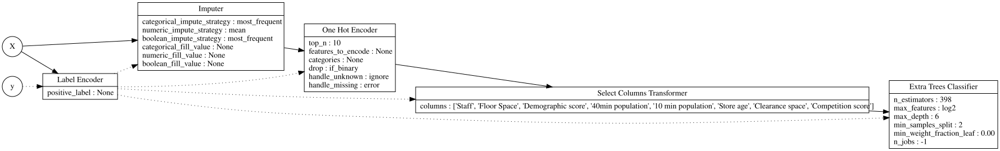

In [ ]:
best_pipeline.graph()

In [ ]:
automl.describe_pipeline(automl.rankings.iloc[0]['id'])


****************************************************************************************************


INFO:evalml.pipelines.pipeline_base.describe:
****************************************************************************************************


* Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer *


INFO:evalml.pipelines.pipeline_base.describe:* Extra Trees Classifier w/ Label Encoder + Imputer + One Hot Encoder + Select Columns Transformer *


****************************************************************************************************


INFO:evalml.pipelines.pipeline_base.describe:****************************************************************************************************


INFO:evalml.pipelines.pipeline_base.describe:


Problem Type: binary


INFO:evalml.pipelines.pipeline_base.describe:Problem Type: binary


Model Family: Extra Trees


INFO:evalml.pipelines.pipeline_base.describe:Model Family: Extra Trees


INFO:evalml.pipelines.pipeline_base.describe:


Pipeline Steps


INFO:evalml.pipelines.pipeline_base.describe:Pipeline Steps


INFO:evalml.pipelines.pipeline_base.describe:==============


1. Label Encoder


INFO:evalml.pipelines.component_graph.describe:1. Label Encoder


	 * positive_label : None


INFO:evalml.pipelines.components.component_base.describe:	 * positive_label : None


2. Imputer


INFO:evalml.pipelines.component_graph.describe:2. Imputer


	 * categorical_impute_strategy : most_frequent


INFO:evalml.pipelines.components.component_base.describe:	 * categorical_impute_strategy : most_frequent


	 * numeric_impute_strategy : mean


INFO:evalml.pipelines.components.component_base.describe:	 * numeric_impute_strategy : mean


	 * boolean_impute_strategy : most_frequent


INFO:evalml.pipelines.components.component_base.describe:	 * boolean_impute_strategy : most_frequent


	 * categorical_fill_value : None


INFO:evalml.pipelines.components.component_base.describe:	 * categorical_fill_value : None


	 * numeric_fill_value : None


INFO:evalml.pipelines.components.component_base.describe:	 * numeric_fill_value : None


	 * boolean_fill_value : None


INFO:evalml.pipelines.components.component_base.describe:	 * boolean_fill_value : None


3. One Hot Encoder


INFO:evalml.pipelines.component_graph.describe:3. One Hot Encoder


	 * top_n : 10


INFO:evalml.pipelines.components.component_base.describe:	 * top_n : 10


	 * features_to_encode : None


INFO:evalml.pipelines.components.component_base.describe:	 * features_to_encode : None


	 * categories : None


INFO:evalml.pipelines.components.component_base.describe:	 * categories : None


	 * drop : if_binary


INFO:evalml.pipelines.components.component_base.describe:	 * drop : if_binary


	 * handle_unknown : ignore


INFO:evalml.pipelines.components.component_base.describe:	 * handle_unknown : ignore


	 * handle_missing : error


INFO:evalml.pipelines.components.component_base.describe:	 * handle_missing : error


4. Select Columns Transformer


INFO:evalml.pipelines.component_graph.describe:4. Select Columns Transformer


	 * columns : ['Staff', 'Floor Space', 'Demographic score', '40min population', '10 min population', 'Store age', 'Clearance space', 'Competition score']


INFO:evalml.pipelines.components.component_base.describe:	 * columns : ['Staff', 'Floor Space', 'Demographic score', '40min population', '10 min population', 'Store age', 'Clearance space', 'Competition score']


5. Extra Trees Classifier


INFO:evalml.pipelines.component_graph.describe:5. Extra Trees Classifier


	 * n_estimators : 398


INFO:evalml.pipelines.components.component_base.describe:	 * n_estimators : 398


	 * max_features : log2


INFO:evalml.pipelines.components.component_base.describe:	 * max_features : log2


	 * max_depth : 6


INFO:evalml.pipelines.components.component_base.describe:	 * max_depth : 6


	 * min_samples_split : 2


INFO:evalml.pipelines.components.component_base.describe:	 * min_samples_split : 2


	 * min_weight_fraction_leaf : 0.0


INFO:evalml.pipelines.components.component_base.describe:	 * min_weight_fraction_leaf : 0.0


	 * n_jobs : -1


INFO:evalml.pipelines.components.component_base.describe:	 * n_jobs : -1


INFO:evalml.automl.automl_search.describe_pipeline:


Training


INFO:evalml.automl.automl_search.describe_pipeline:Training


INFO:evalml.automl.automl_search.describe_pipeline:========


Training for binary problems.


INFO:evalml.automl.automl_search.describe_pipeline:Training for binary problems.


Total training time (including CV): 3.8 seconds


INFO:evalml.automl.automl_search.describe_pipeline:Total training time (including CV): 3.8 seconds


INFO:evalml.automl.automl_search.describe_pipeline:


Cross Validation


INFO:evalml.automl.automl_search.describe_pipeline:Cross Validation


----------------


INFO:evalml.automl.automl_search.describe_pipeline:----------------


             Log Loss Binary   AUC # Training # Validation
0                      0.596 0.734         72           36
1                      0.515 0.836         72           36
2                      0.552 0.780         72           36
mean                   0.554 0.783          -            -
std                    0.041 0.051          -            -
coef of var            0.073 0.065          -            -


INFO:evalml.automl.automl_search.describe_pipeline:             Log Loss Binary   AUC # Training # Validation
0                      0.596 0.734         72           36
1                      0.515 0.836         72           36
2                      0.552 0.780         72           36
mean                   0.554 0.783          -            -
std                    0.041 0.051          -            -
coef of var            0.073 0.065          -            -


In [ ]:
best_pipeline.fit(X_train, y_train)
print(best_pipeline.predict(X_test))
best_pipeline.score(X_test, y_test, objectives=["auc"])

99     Good
68     Good
106     Bad
20     Good
43     Good
63      Bad
13     Good
111     Bad
126    Good
129     Bad
45     Good
41     Good
28      Bad
101     Bad
120    Good
32     Good
52     Good
5       Bad
85     Good
82     Good
86      Bad
27     Good
17     Good
19     Good
11      Bad
112     Bad
46     Good
Name: Performance, dtype: category
Categories (2, object): ['Bad', 'Good']


OrderedDict([('AUC', 0.6555555555555556)])

In [ ]:
best_pipeline_score = best_pipeline.score(
    X_test, y_test, objectives=["auc"]
)
best_pipeline_score

OrderedDict([('AUC', 0.6555555555555556)])

In [ ]:
from evalml.model_understanding import graph_confusion_matrix

# pipeline trained with log loss
y_pred = best_pipeline.predict(X_test)
graph_confusion_matrix(y_test, y_pred)